## DS 7333 - Quantifying the World
## Case Study #5: "Working with Missing Data"

Sterling Beason, Sean Kennedy, Emil Ramos

In [4]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from IPython.display import Markdown as md

In [5]:
# load data
boston = load_boston()

In [6]:
# display data descriptions
md(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
        - LSTAT    % lower status of the population
        - MEDV     Median value of owner-occupied homes in $1000's

    :Missing Attribute Values: None

    :Creator: Harrison, D. and Rubinfeld, D.L.

This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/


This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.

The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic
prices and the demand for clean air', J. Environ. Economics & Management,
vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics
...', Wiley, 1980.   N.B. Various transformations are used in the table on
pages 244-261 of the latter.

The Boston house-price data has been used in many machine learning papers that address regression
problems.   
     
.. topic:: References

   - Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.
   - Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.


### DataFrame Creation & Data Partitioning

In [7]:
# create independent and dependent dataframes
df = pd.DataFrame(boston.data, columns=boston.feature_names) # features dataframe
df_targets = pd.DataFrame(boston.target, columns=['target']) # targets dataframe

In [19]:
df_targets.describe()

,target
count,506.000000
mean,22.532806
std,9.197104
min,5.000000
25%,17.025000
50%,21.200000
75%,25.000000
max,50.000000


In [8]:
# partition data
X_train, X_test, y_train, y_test = train_test_split(df, df_targets.target, test_size=0.33, random_state=7337)

### Explore Data

#### Feature Correlation

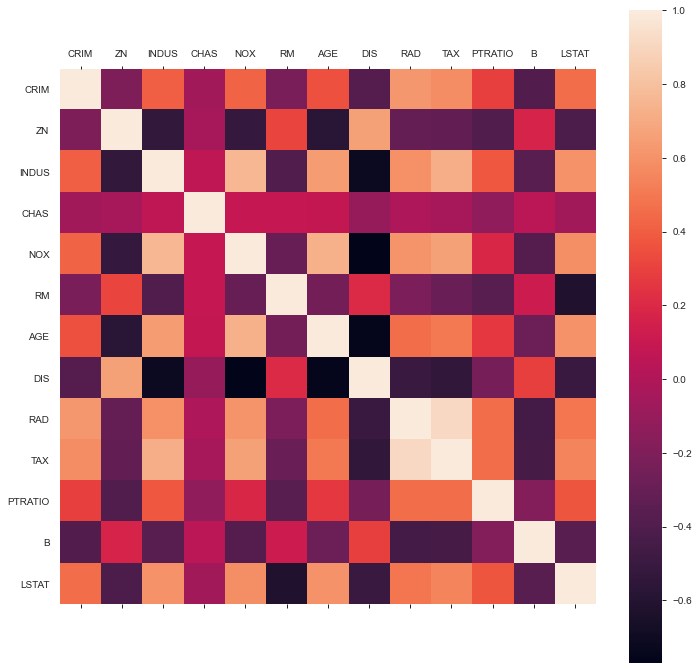

In [9]:
fig, ax = plt.subplots(figsize=(12,12))
im = ax.matshow(df.corr())
ax.set_xticks(np.arange(len(df.columns))) # force to show all x labels
ax.set_yticks(np.arange(len(df.columns))) # force to show all y labels
ax.set_xticklabels(df.columns)
ax.set_yticklabels(df.columns)
fig.colorbar(im)
plt.show()

#### Profile Dataset

In [11]:
profile = ProfileReport(df, title="Boston Features Profile")
profile.to_notebook_iframe()

### Create Dataset Missing Values 

Randomize 1%, 5% 10%, 20%, 33%, and 50% missing values in a single column

In [12]:
df_dict = {} # will hold dataframes with various % of missing values
percentages = [0.01, 0.05, 0.1, 0.2, 0.33, 0.5]
column = 'AGE'

for p in percentages:
    in_sample = df.sample(frac=p, random_state=42) # sample copy dataframe with fraction at p
    in_sample[column] = np.NaN # set selected column values to NaN

    out_sample = df[~df.isin(in_sample)].dropna()
    
    df_dict[str(int(p * 100))] = pd.concat([out_sample, in_sample]).sort_index() 
    

In [13]:
for key in df_dict.keys():
    print(f"df_dict[\"{key}\"]: '{column}' column, in {int(key) / 100}%",
          f"sampled dataframe, has {df_dict[key].isnull().sum()[column]}",
          f"of {df_dict[key].shape[0]} missing values")
          

df_dict["1"]: 'AGE' column, in 0.01% sampled dataframe, has 5 of 506 missing values
df_dict["5"]: 'AGE' column, in 0.05% sampled dataframe, has 25 of 506 missing values
df_dict["10"]: 'AGE' column, in 0.1% sampled dataframe, has 51 of 506 missing values
df_dict["20"]: 'AGE' column, in 0.2% sampled dataframe, has 101 of 506 missing values
df_dict["33"]: 'AGE' column, in 0.33% sampled dataframe, has 167 of 506 missing values
df_dict["50"]: 'AGE' column, in 0.5% sampled dataframe, has 253 of 506 missing values


### Baseline Model w/o Missing Values

In [14]:
reg = LinearRegression(normalize=True)
reg.fit(X_train, y_train)
reg.score(X_train, y_train)

0.7196488510369425

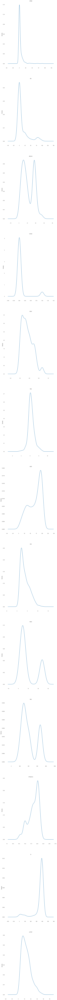

In [30]:
fig, ax = plt.subplots(nrows=len(df.columns), ncols=1, figsize=(10,200))
ax.ravel()
for i, x in enumerate(df.columns):
 p = df[x].plot(kind='kde', ax=ax[i])
 p.set_title(f'{x}')
 p